#**Music Recommender System using K-means Clustering**


###Importing Necessary Libraries

In [ ]:
import numpy as np
import pandas as pd

import plotly.express as px 
import matplotlib.pyplot as plt
%matplotlib inline

from sklearn.cluster import KMeans
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA

###Data

In [ ]:
data = pd.read_csv("data.csv")

In [ ]:
feature_names = ['acousticness', 'danceability', 'energy', 'instrumentalness','liveness', 'loudness', 'speechiness', 'tempo', 'valence','duration_ms','explicit','key','mode','year']
X, y = data[feature_names], data['popularity']

In [ ]:
X.head()

,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,duration_ms,explicit,key,mode,year
0,0.982,0.279,0.211,0.878000,0.665,-20.096,0.0366,80.954,0.0594,831667,0,10,1,1921
1,0.732,0.819,0.341,0.000000,0.160,-12.441,0.4150,60.936,0.9630,180533,0,7,1,1921
2,0.961,0.328,0.166,0.913000,0.101,-14.850,0.0339,110.339,0.0394,500062,0,3,1,1921
3,0.967,0.275,0.309,0.000028,0.381,-9.316,0.0354,100.109,0.1650,210000,0,5,1,1921
4,0.957,0.418,0.193,0.000002,0.229,-10.096,0.0380,101.665,0.2530,166693,0,3,1,1921


In [ ]:
X.describe()

,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,duration_ms,explicit,key,mode,year
count,1.706530e+05,1.706530e+05,1.706530e+05,1.706530e+05,1.706530e+05,1.706530e+05,1.706530e+05,1.706530e+05,1.706530e+05,1.706530e+05,1.706530e+05,1.706530e+05,1.706530e+05,1.706530e+05
mean,-2.108502e-15,-1.965851e-16,-3.076365e-15,2.869124e-15,-1.273130e-14,4.197057e-16,-6.303723e-17,-4.048583e-17,-9.092440e-16,-2.119552e-16,-3.611455e-14,-1.991877e-15,1.256025e-14,8.139243e-15
std,1.000003e+00,1.000003e+00,1.000003e+00,1.000003e+00,1.000003e+00,1.000003e+00,1.000003e+00,1.000003e+00,1.000003e+00,1.000003e+00,1.000003e+00,1.000003e+00,1.000003e+00,1.000003e+00
min,-1.335303e+00,-3.051005e+00,-1.802346e+00,-5.327705e-01,-1.177539e+00,-8.517487e+00,-6.046055e-01,-3.805520e+00,-2.008534e+00,-1.790706e+00,-3.039555e-01,-1.479295e+00,-1.553007e+00,-2.152470e+00
25%,-1.064048e+00,-6.948874e-01,-8.495914e-01,-5.327705e-01,-6.123348e-01,-5.523080e-01,-3.901525e-01,-7.633272e-01,-8.039923e-01,-4.846357e-01,-3.039555e-01,-9.103181e-01,-1.553007e+00,-8.020457e-01
50%,3.692581e-02,6.020570e-02,-4.255203e-02,-5.320815e-01,-3.995252e-01,1.558444e-01,-3.280902e-01,-6.944636e-02,4.336649e-02,-1.861852e-01,-3.039555e-01,-5.685331e-02,6.439120e-01,8.209008e-03
75%,1.039504e+00,7.414927e-01,8.242681e-01,-2.073844e-01,3.155608e-01,7.520262e-01,-1.400597e-01,6.081523e-01,8.299282e-01,2.493829e-01,-3.039555e-01,7.966115e-01,6.439120e-01,8.570473e-01
max,1.313418e+00,2.558258e+00,1.933947e+00,2.657289e+00,4.543149e+00,2.689222e+00,5.355837e+00,4.124123e+00,1.791281e+00,4.101357e+01,3.289955e+00,1.650076e+00,6.439120e-01,1.667302e+00


###K-means Clustering

In [ ]:
scaler=StandardScaler()
scaler.fit(X)
X=scaler.fit_transform(X)

In [ ]:
X=pd.DataFrame(X,columns=feature_names)

In [ ]:
X.head()

,acousticness,danceability,energy,instrumentalness,liveness,loudness,speechiness,tempo,valence,duration_ms,explicit,key,mode,year
0,1.276187,-1.467013,-1.013988,2.268102,2.626719,-1.514237,-0.379706,-1.169307,-1.782825,4.763146,-0.303955,1.365588,0.643912,-2.15247
1,0.611347,1.598779,-0.528270,-0.532771,-0.262229,-0.170766,1.945481,-1.821180,1.650688,-0.399747,-0.303955,0.512123,0.643912,-2.15247
2,1.220340,-1.188820,-1.182122,2.379754,-0.599749,-0.593551,-0.396297,-0.212404,-1.858821,2.133824,-0.303955,-0.625830,0.643912,-2.15247
3,1.236296,-1.489722,-0.647832,-0.532682,1.002043,0.377680,-0.387080,-0.545537,-1.381564,-0.166101,-0.303955,-0.056853,0.643912,-2.15247
4,1.209703,-0.677855,-1.081242,-0.532765,0.132499,0.240788,-0.371104,-0.494867,-1.047180,-0.509485,-0.303955,-0.625830,0.643912,-2.15247


In [ ]:
from sklearn.metrics import davies_bouldin_score
sse,db = {}, {}
for k in range(2, 15):
    kmeans = KMeans(n_clusters=k, max_iter=1000,random_state=10).fit(X)
    labels=kmeans.predict(X)
    sse[k] = kmeans.inertia_
    db[k] = davies_bouldin_score(X,labels)

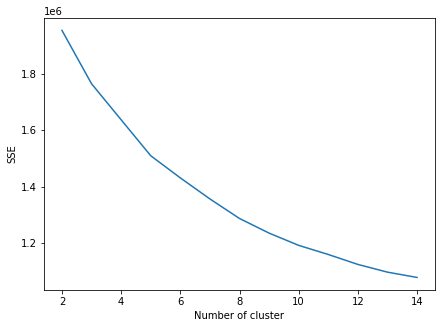

In [ ]:
plt.figure(figsize=(7,5))
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel("Number of cluster")
plt.ylabel("SSE")
plt.show()

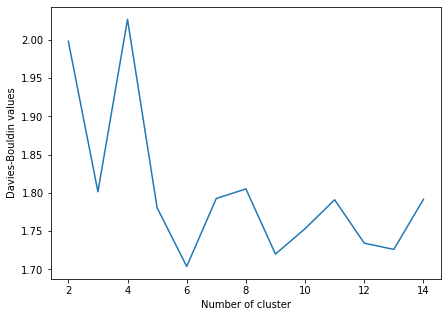

In [ ]:
plt.figure(figsize=(7,5))
plt.plot(list(db.keys()), list(db.values()))
plt.xlabel("Number of cluster")
plt.ylabel("Davies-Bouldin values")
plt.show()

In [ ]:
print(db[6], sse[6])

1.7037508453064234 1430879.0229167868


In [ ]:
kmeans = KMeans(n_clusters=6, max_iter=1000,random_state=10).fit(X)
labels=kmeans.predict(X)

In [ ]:
data['cluster_label'] = labels

###Visualization using PCA

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=2)
song_embedding = pca.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y'], data=song_embedding)
projection['title'] = data['name']
projection['cluster'] = data['cluster_label']
fig = px.scatter(
    projection, x='x', y='y', color='cluster', hover_data=['x', 'y', 'title'])
fig.show()

In [ ]:
from sklearn.decomposition import PCA

pca = PCA(n_components=3)
song_embedding = pca.fit_transform(X)
projection = pd.DataFrame(columns=['x', 'y','z'], data=song_embedding)

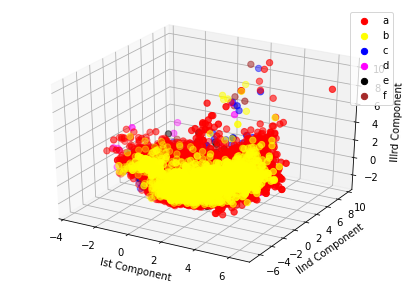

In [ ]:
Xax = song_embedding[:,0]
Yax = song_embedding[:,1]
Zax = song_embedding[:,2]

cdict = {0:'red',1:'yellow',2:'blue',3:'magenta',4:'black',5:'brown'}
labl={0:'a',1:'b',2:'c',3:'d',4:'e',5:'f'}


fig = plt.figure(figsize=(7,5))
ax = fig.add_subplot(111, projection='3d')

fig.patch.set_facecolor('white')
for l in np.unique(labels):
 ix=np.where(y==l)
 ax.scatter(Xax[ix], Yax[ix], Zax[ix], c=cdict[l], s=40,
           label=labl[l])
# for loop ends
ax.set_xlabel("Ist Component", fontsize=10)
ax.set_ylabel("IInd Component", fontsize=10)
ax.set_zlabel("IIIrd Component", fontsize=10)

ax.legend()
plt.show()